In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Food Classification
In today’s world, social media and digital platforms are filled with countless food-related images, thanks to trends like food blogging, gastro-tourism, and recipe sharing. While these images inspire creativity and connect people through their love of food, the sheer volume makes it difficult to categorize and find relevant content efficiently. Imagine having a tool that could quickly identify dishes, suggest recipes, or even help with dietary tracking—this is where food image classification comes in.

Our project is designed to tackle this challenge by using Convolutional Neural Networks (CNNs) to classify food images accurately. With the help of the Food-101 dataset, which features over 101,000 images across 101 categories, we aim to build a model that doesn’t just identify food but does so with high precision. By utilizing techniques like data augmentation and transfer learning, we’ll make the model robust enough to handle real-world scenarios, where lighting, angles, and image quality can vary widely.

Ultimately, this project isn’t just about technology; it’s about making everyday tasks—like finding recipes or keeping track of meals—more intuitive and efficient, showing how AI can make even small moments in life a little easier.

## Importing Required Libraries

In [123]:
import numpy as np
import pandas as pd
from pathlib import Path
import os.path
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

import tensorflow as tf

from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score,accuracy_score



In [54]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, Callback
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

from tensorflow.keras.models import load_model

In [104]:
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3, ResNet152
from tensorflow.keras.optimizers import Adam
import time



## Exploring the Dataset
To get a closer look at the Food-101 dataset, we started by organizing the images and their labels into a simple, easy-to-use format. Each image in the dataset represents a specific type of food, and it is stored in a folder named after its category. By pulling this information together, we created a table where each row links an image to its food category.

In [26]:
base_path = '/kaggle/input/food-101/food-101/food-101/'
meta_path = os.path.join(base_path, 'meta')
images_path = os.path.join(base_path, 'images')

In [27]:
image_dir = Path('/kaggle/input/food-101/food-101/food-101/')

In [28]:
filepaths = list(image_dir.glob(r'**/*.jpg'))



In [29]:
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

images = pd.concat([filepaths, labels], axis=1)


Since the dataset is vast, we selected a smaller sample to work with, ensuring it covers a good mix of all 101 food categories. This helps us understand the data better while keeping things manageable.


In [30]:
category_samples = []
for category in images['Label'].unique():
    category_slice = images.query("Label == @category")
    category_samples.append(category_slice.sample(300, random_state=1))
image_df = pd.concat(category_samples, axis=0).sample(frac=1.0, random_state=1).reset_index(drop=True)

In [31]:
image_df

,Filepath,Label
0,/kaggle/input/food-101/food-101/food-101/image...,lobster_roll_sandwich
1,/kaggle/input/food-101/food-101/food-101/image...,chocolate_mousse
2,/kaggle/input/food-101/food-101/food-101/image...,poutine
3,/kaggle/input/food-101/food-101/food-101/image...,frozen_yogurt
4,/kaggle/input/food-101/food-101/food-101/image...,bruschetta
...,...,...
30295,/kaggle/input/food-101/food-101/food-101/image...,nachos
30296,/kaggle/input/food-101/food-101/food-101/image...,falafel
30297,/kaggle/input/food-101/food-101/food-101/image...,spaghetti_carbonara
30298,/kaggle/input/food-101/food-101/food-101/image...,macarons


In [32]:
image_df['Label'].value_counts()

Label
garlic_bread             300
lobster_roll_sandwich    300
chocolate_mousse         300
poutine                  300
frozen_yogurt            300
                        ... 
chicken_curry            300
grilled_salmon           300
churros                  300
chocolate_cake           300
filet_mignon             300
Name: count, Length: 101, dtype: int64


To make it more engaging, we randomly picked nine images from the dataset to display. These images were shown in a neat grid, with each image labeled by its food category. This way, we can see the diversity in the dataset at a glance.

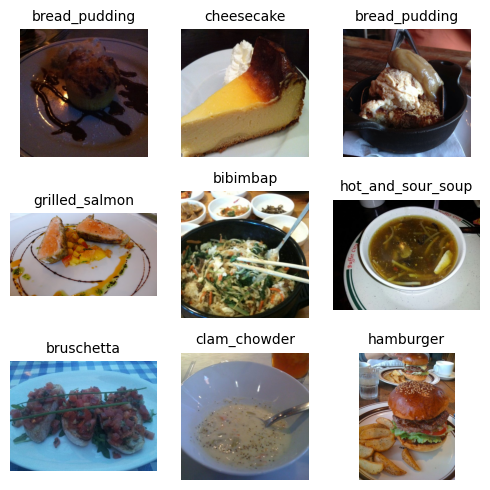

In [34]:
import random
from PIL import Image

# Number of images to display
num_images = 9


random_indx = random.sample(range(len(train_df)), num_images)
random_images = train_df.iloc[random_indx]


fig, axes = plt.subplots(3, 3, figsize=(5, 5))
axes = axes.flatten()

for ax, (filepath, label) in zip(axes, zip(random_images['Filepath'], random_images['Label'])):
 
    img = Image.open(filepath)
    ax.imshow(img)
    ax.axis('off')  
    ax.set_title(label, fontsize=10)  

plt.tight_layout()
plt.show()



This step not only helped us visualize the variety in the dataset but also confirmed that the images and labels were correctly organized, setting the stage for building our food classification model.

## Exploratory Data Analysis

We analyzed how images are distributed across the 101 food categories in the Food-101 dataset. A bar chart was created to show the number of images per category, making it easy to spot any imbalances. This visualization helps us understand if some categories are over- or under-represented, which is crucial for training a fair and accurate model.

In [ ]:
plt.figure(figsize = (20,5))
class_counts = images['Label'].value_counts()
plt.bar(class_counts.index, class_counts.values)
plt.xticks(rotation=90)
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.show()


We analyzed the dimensions of the images in the dataset and observed that one side of most images is consistently 500 pixels. The scatter plot shows that the images vary between being horizontal or vertical, depending on whether the width or height is 500 pixels. This consistency in at least one dimension simplifies the preprocessing and ensures the dataset is ready for effective model training.

In [ ]:
import numpy as np
from PIL import Image

image_sizes = []
for img_path in filepaths:  # Replace `image_paths` with your actual list of image file paths
    img = Image.open(img_path)
    image_sizes.append(img.size)

image_sizes = np.array(image_sizes)
plt.scatter(image_sizes[:, 0], image_sizes[:, 1])
plt.title("Image Dimensions Distribution")
plt.xlabel("Width")
plt.ylabel("Height")
plt.show()


# Image Preprocessing and Model Pipeline

## Splitting the Dataset
The dataset was divided into training and testing sets, with 70% of the data used for training. This ensures the model has sufficient data for learning while reserving unseen data to evaluate its performance.

In [33]:
train_df, test_df = train_test_split(image_df, train_size=0.7, shuffle=True, random_state=1)

## Data Generators for Preprocessing
We used TensorFlow's ImageDataGenerator to prepare the images for the model. These generators handle tasks like resizing images to a uniform shape and applying MobileNetV2 preprocessing to normalize pixel values. Validation data is also separated from the training set for fine-tuning.

In [35]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
validation_split=0.2
)
test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
)

The images are resized to 224x224 pixels to align with the input requirements of MobileNetV2. A batch size of 32 was chosen for efficient training and memory management.

In [39]:
input_shape = (224,224)
batch_size = 32

## Generating Image Data
Using the generators, we loaded and processed the training, validation, and testing sets. The data was prepared for the model with attributes like target size, color mode, and label encoding.

In [40]:

train_images = train_generator.flow_from_dataframe(
dataframe=train_df,
x_col='Filepath',
y_col='Label',
target_size=input_shape,
color_mode='rgb',
class_mode='categorical',
batch_size=batch_size,
shuffle=True,
seed=42,
subset='training'
)
val_images = train_generator.flow_from_dataframe(
dataframe=train_df,
x_col='Filepath',
y_col='Label',
target_size=input_shape,
color_mode='rgb',
class_mode='categorical',
batch_size=batch_size,
shuffle=True,
seed=42,
subset='validation'
)
test_images = test_generator.flow_from_dataframe(
dataframe=test_df,
x_col='Filepath',
y_col='Label',
target_size=input_shape,
color_mode='rgb',
class_mode='categorical',
batch_size=batch_size,
shuffle=False
)

Found 16968 validated image filenames belonging to 101 classes.
Found 4242 validated image filenames belonging to 101 classes.
Found 9090 validated image filenames belonging to 101 classes.


# Model Training

In [ ]:
def print_header(title):
    print("\n" + "="*50)
    print(f"{title.center(50)}")
    print("="*50 + "\n")

def plot_history(history):
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.legend()
    plt.title('Accuracy')
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title('Loss')
    plt.show()

def model_evaluation(model, test_images, ):
    # Print Header for Evaluation    
    print_header('MODEL EVALUATION')

    # Predict on Test Images
    test_preds = model.predict(test_images)
    test_labels = test_images.labels  

    # Classification Report
    print("\nClassification Report:")
    print(classification_report(test_labels, test_preds.argmax(axis=1)))

    # Confusion Matrix
    print("\nConfusion Matrix:")
    cm = confusion_matrix(test_labels, test_preds.argmax(axis=1))
    plt.figure(figsize=(20, 20))
    sns.heatmap(
        cm,
        fmt='d',
        cmap='Blues',
        xticklabels=test_images.class_indices.keys(),
        yticklabels=test_images.class_indices.keys()
    )
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # AUC Score
    fpr, tpr, thresholds = roc_curve(true_y, y_prob)

    auc = roc_auc_score(
        tf.keras.utils.to_categorical(test_labels, num_classes=len(test_images.class_indices)),
        test_preds,
        multi_class='ovr'
    )
    print(f"\nAUC Score: {auc:.4f}")


In [96]:

# Custom Callback for Loss Improvement Logging
class LossImprovementCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch == 0:
            self.prev_loss = logs.get('val_loss')
        else:
            improvement = self.prev_loss - logs.get('val_loss')
            print(f"Epoch {epoch + 1}: Validation Loss Improvement: {improvement:.4f}")
            self.prev_loss = logs.get('val_loss')

def pretrained_model_fit(pretrained_model,model_name,train_images,val_images, test_images,epochs= 20,monitor = 'val_loss',monitor_mode = 'auto'):
    inputs = pretrained_model.input
    x = tf.keras.layers.Dense(1024, activation='relu')(pretrained_model.output)
    x = tf.keras.layers.Dropout(0.25)(x)
    x = tf.keras.layers.Dense(1024, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.25)(x)
    outputs = tf.keras.layers.Dense(101, activation='softmax')(x)
    model = tf.keras.Model(inputs, outputs)

    print_header('SUMMARY OF THE MODEL')
    print(model.summary())
    
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy', 'AUC']
    )

    # Model Training
    print_header('MODEL TRAINING')
    checkpoint_filepath = f'best_{model_name}.keras'
    checkpoint = ModelCheckpoint(
        checkpoint_filepath,
        save_best_only=True,
        monitor=monitor,
        mode=monitor_mode,
        verbose=1
    )
    history = model.fit(
        train_images,
        validation_data=val_images,
        epochs=epochs,
        callbacks=[
            tf.keras.callbacks.EarlyStopping(
                monitor=monitor,
                patience=5,
                restore_best_weights=True
            ),
            checkpoint,
            LossImprovementCallback()
        ]
    )
    print_header('TRAINING HISTORY PLOTS')
    plot_history(history)    
    best_model = load_model(checkpoint_filepath)
    return best_model



## MobileNetV2


In [71]:
mobile_net_v2 = tf.keras.applications.MobileNetV2(
input_shape=(224, 224, 3),
include_top=False,
weights='imagenet',
pooling='avg'
)
mobile_net_v2.trainable = False



               SUMMARY OF THE MODEL               



Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_7[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,451,493 (9.35 MB)

 Trainable params: 193,509 (755.89 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

None

                  MODEL TRAINING                  

Epoch 1/20
530/531 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - AUC: 0.7798 - accuracy: 0.1674 - loss: 3.7033
Epoch 1: val_loss improved from inf to 2.28182, saving model to best_mobile_net_v2.keras
531/531 ━━━━━━━━━━━━━━━━━━━━ 90s 156ms/step - AUC: 0.7802 - accuracy: 0.1679 - loss: 3.7007 - val_AUC: 0.9381 - val_accuracy: 0.4182 - val_loss: 2.2818
Epoch 2/20
530/531 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - AUC: 0.9521 - accuracy: 0.4923 - loss: 1.9689
Epoch 2: val_loss improved from 2.28182 to 2.19062, saving model to best_mobile_net_v2.keras
Epoch 2: Validation Loss Improvement: 0.0912
531/531 ━━━━━━━━━━━━━━━━━━━━ 60s 111ms/step - AUC: 0.9521 - accuracy: 0.4923 - loss: 1.9689 - val_AUC: 0.9358 - val_accuracy: 0.4422 - val_loss: 2.1906
Epoch 3/20
530/531 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - AUC: 0.9675 - accuracy: 0.5715 - loss: 1.6052
Epoch 3: val_loss improved from 2.19062 to 2.11435, saving model to best_mobile_net_v2.keras
Epoch 3: Valid

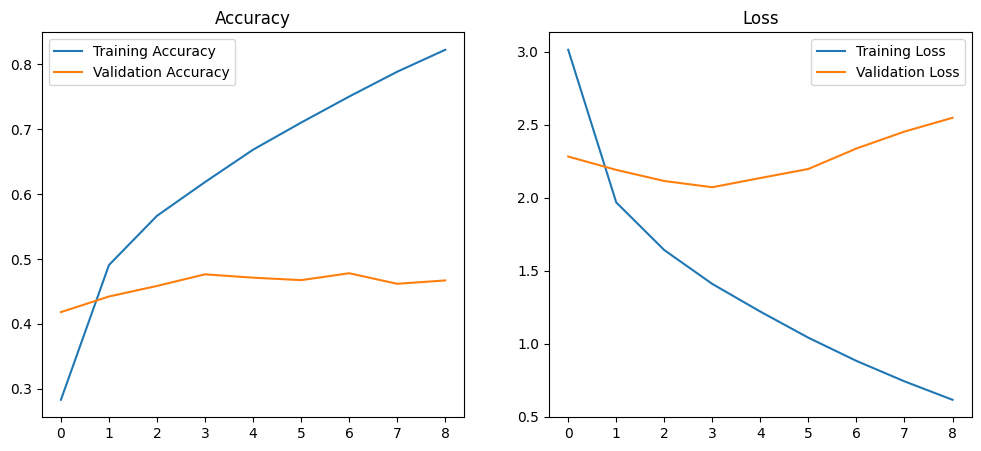

In [72]:
mobile_net_model = pretrained_model_fit(mobile_net_v2,'mobile_net_v2',train_images,val_images,test_images)


                 MODEL EVALUATION                 

285/285 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.24      0.13      0.17        77
           1       0.28      0.58      0.38        77
           2       0.40      0.53      0.45        76
           3       0.34      0.49      0.40        78
           4       0.33      0.44      0.38        90
           5       0.34      0.38      0.36        98
           6       0.56      0.81      0.66        84
           7       0.54      0.71      0.61       103
           8       0.36      0.17      0.23        83
           9       0.66      0.32      0.43        97
          10       0.40      0.31      0.35        88
          11       0.60      0.63      0.62        76
          12       0.52      0.51      0.52        84
          13       0.31      0.60      0.41        83
          14       0.59      0.34      0.43        99
          15   

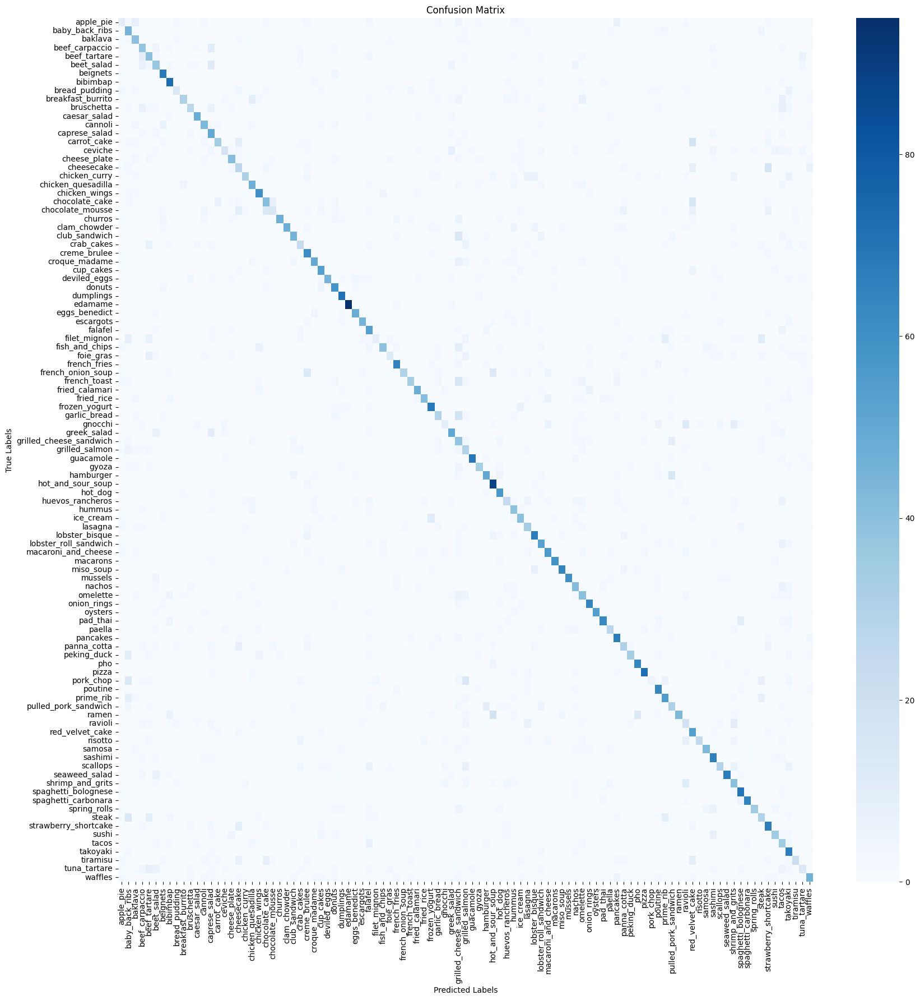


AUC Score: 0.9625


In [83]:
model_evaluation(mobile_net_model,test_images)

## VGG19 Model 


In [84]:
vgg19_model = tf.keras.applications.VGG19(
input_shape=(224, 224, 3),
include_top=False,
weights='imagenet',
pooling='avg'
)
vgg19_model.trainable = False


               SUMMARY OF THE MODEL               



Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_8      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 20,119,589 (76.75 MB)

 Trainable params: 95,205 (371.89 KB)

 Non-trainable params: 20,024,384 (76.39 MB)

None

                  MODEL TRAINING                  

Epoch 1/20
531/531 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - AUC: 0.6264 - accuracy: 0.0403 - loss: 4.4215
Epoch 1: val_loss improved from inf to 3.68312, saving model to best_VGG19.keras
531/531 ━━━━━━━━━━━━━━━━━━━━ 72s 129ms/step - AUC: 0.6266 - accuracy: 0.0404 - loss: 4.4209 - val_AUC: 0.8304 - val_accuracy: 0.1297 - val_loss: 3.6831
Epoch 2/20
531/531 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - AUC: 0.8589 - accuracy: 0.1763 - loss: 3.4555
Epoch 2: val_loss improved from 3.68312 to 3.28532, saving model to best_VGG19.keras
Epoch 2: Validation Loss Improvement: 0.3978
531/531 ━━━━━━━━━━━━━━━━━━━━ 61s 114ms/step - AUC: 0.8589 - accuracy: 0.1764 - loss: 3.4554 - val_AUC: 0.8731 - val_accuracy: 0.2143 - val_loss: 3.2853
Epoch 3/20
531/531 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - AUC: 0.8913 - accuracy: 0.2487 - loss: 3.0951
Epoch 3: val_loss improved from 3.28532 to 3.11562, saving model to best_VGG19.keras
Epoch 3: Validation Loss Improvement: 0

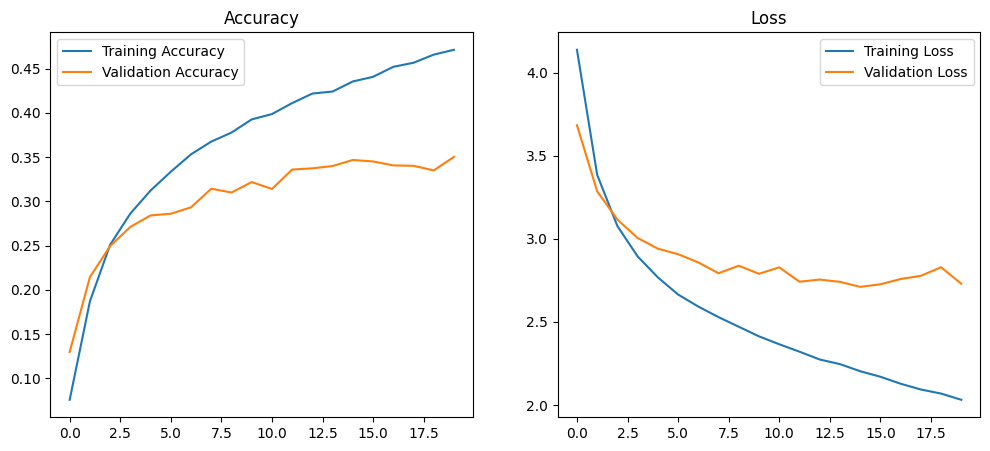

In [86]:
vgg19_model = pretrained_model_fit(vgg19_model,'VGG19',train_images,val_images,test_images)


                 MODEL EVALUATION                 

285/285 ━━━━━━━━━━━━━━━━━━━━ 39s 134ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.21      0.17      0.19        77
           1       0.30      0.48      0.37        77
           2       0.22      0.34      0.27        76
           3       0.39      0.29      0.34        78
           4       0.23      0.18      0.20        90
           5       0.30      0.21      0.25        98
           6       0.46      0.60      0.52        84
           7       0.30      0.54      0.38       103
           8       0.24      0.17      0.20        83
           9       0.17      0.11      0.13        97
          10       0.25      0.03      0.06        88
          11       0.43      0.45      0.44        76
          12       0.30      0.44      0.35        84
          13       0.22      0.45      0.29        83
          14       0.31      0.18      0.23        99
          15  

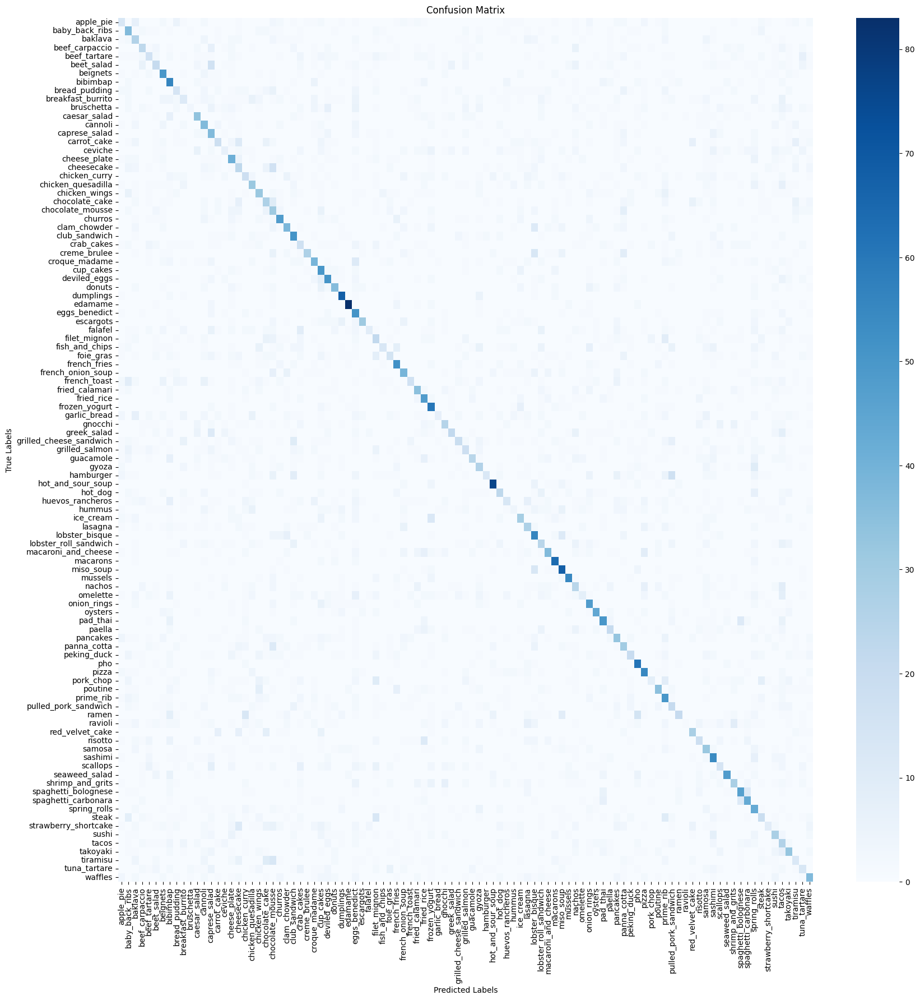


AUC Score: 0.9299


In [88]:
model_evaluation(vgg19_model,test_images)

## ResNet50 Model

In [97]:
res_net50_model = tf.keras.applications.ResNet50(
input_shape=(224, 224, 3),
include_top=False,
weights='imagenet',
pooling='avg'
)
res_net50_model.trainable = False


               SUMMARY OF THE MODEL               



Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_12[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 26,839,013 (102.38 MB)

 Trainable params: 3,251,301 (12.40 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

None

                  MODEL TRAINING                  

Epoch 1/20
530/531 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - AUC: 0.5490 - accuracy: 0.0157 - loss: 4.6321
Epoch 1: val_loss improved from inf to 4.44847, saving model to best_ResNet50.keras
531/531 ━━━━━━━━━━━━━━━━━━━━ 81s 130ms/step - AUC: 0.5491 - accuracy: 0.0157 - loss: 4.6318 - val_AUC: 0.6432 - val_accuracy: 0.0295 - val_loss: 4.4485
Epoch 2/20
530/531 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - AUC: 0.6417 - accuracy: 0.0303 - loss: 4.4437
Epoch 2: val_loss improved from 4.44847 to 4.41445, saving model to best_ResNet50.keras
Epoch 2: Validation Loss Improvement: 0.0340
531/531 ━━━━━━━━━━━━━━━━━━━━ 63s 118ms/step - AUC: 0.6417 - accuracy: 0.0303 - loss: 4.4437 - val_AUC: 0.6587 - val_accuracy: 0.0370 - val_loss: 4.4145
Epoch 3/20
530/531 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - AUC: 0.6730 - accuracy: 0.0396 - loss: 4.3743
Epoch 3: val_loss improved from 4.41445 to 4.35916, saving model to best_ResNet50.keras
Epoch 3: Validation Loss Impro

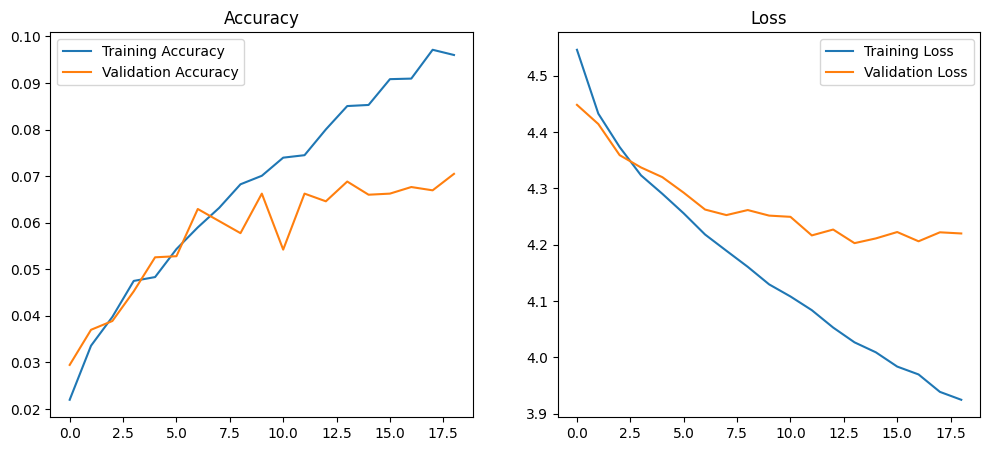

In [98]:
res_net50_model = pretrained_model_fit(res_net50_model,'ResNet50',train_images,val_images,test_images)


                 MODEL EVALUATION                 

285/285 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        77
           1       0.04      0.16      0.06        77
           2       0.07      0.05      0.06        76
           3       0.07      0.01      0.02        78
           4       0.00      0.00      0.00        90
           5       0.13      0.07      0.09        98
           6       0.02      0.06      0.03        84
           7       0.12      0.02      0.03       103
           8       0.00      0.00      0.00        83
           9       0.00      0.00      0.00        97
          10       0.03      0.01      0.02        88
          11       0.05      0.05      0.05        76
          12       0.01      0.02      0.02        84
          13       0.03      0.02      0.03        83
          14       0.09      0.05      0.07        99
          15  

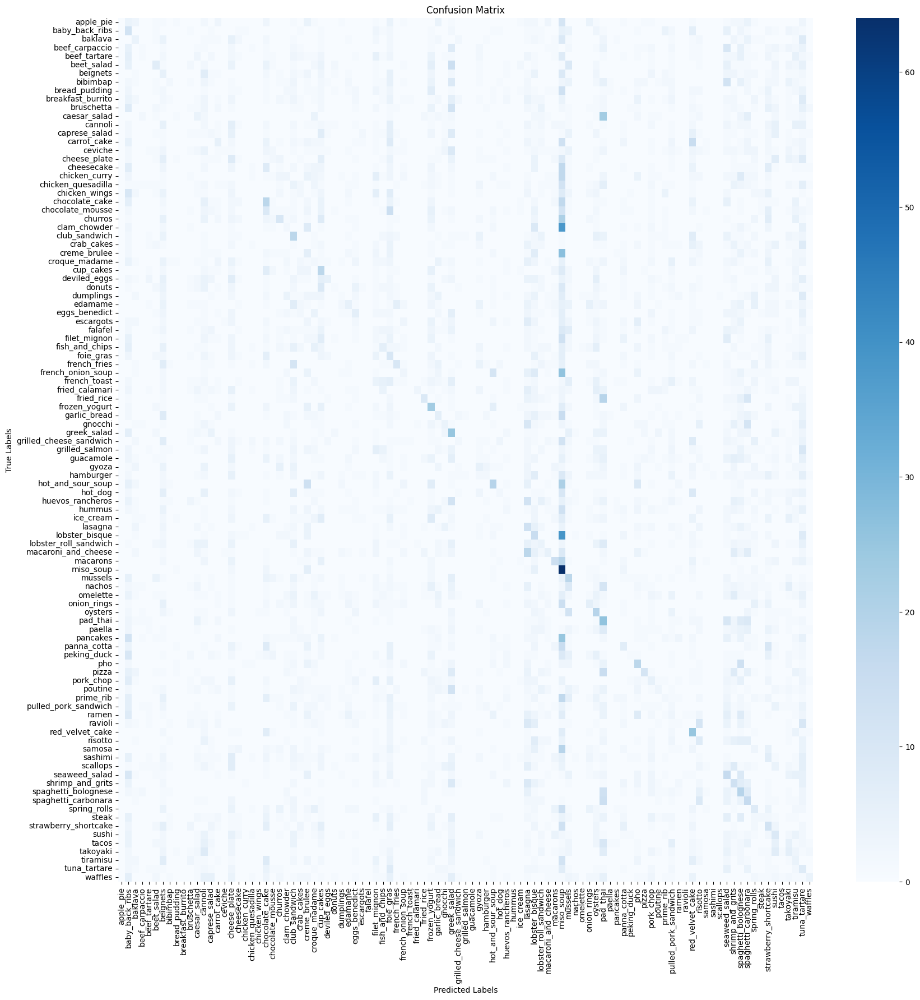


AUC Score: 0.7547


In [101]:
model_evaluation(res_net50_model,test_images)

## InceptionV3 Model

In [99]:
inception_v3_model = tf.keras.applications.InceptionV3(
input_shape=(224, 224, 3),
include_top=False,
weights='imagenet',
pooling='avg'
)
inception_v3_model.trainable = False

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step



               SUMMARY OF THE MODEL               



Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 111, 111,  │        864 │ input_layer_13[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 111, 111,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 54, 54,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 25,054,085 (95.57 MB)

 Trainable params: 3,251,301 (12.40 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

None

                  MODEL TRAINING                  

Epoch 1/20
530/531 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - AUC: 0.7671 - accuracy: 0.1324 - loss: 3.9159
Epoch 1: val_loss improved from inf to 2.72078, saving model to best_InceptionV3.keras
531/531 ━━━━━━━━━━━━━━━━━━━━ 118s 190ms/step - AUC: 0.7674 - accuracy: 0.1327 - loss: 3.9140 - val_AUC: 0.9202 - val_accuracy: 0.3166 - val_loss: 2.7208
Epoch 2/20
530/531 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - AUC: 0.9076 - accuracy: 0.3113 - loss: 2.7808
Epoch 2: val_loss improved from 2.72078 to 2.53751, saving model to best_InceptionV3.keras
Epoch 2: Validation Loss Improvement: 0.1833
531/531 ━━━━━━━━━━━━━━━━━━━━ 60s 111ms/step - AUC: 0.9076 - accuracy: 0.3113 - loss: 2.7806 - val_AUC: 0.9290 - val_accuracy: 0.3642 - val_loss: 2.5375
Epoch 3/20
530/531 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - AUC: 0.9250 - accuracy: 0.3652 - loss: 2.5094
Epoch 3: val_loss improved from 2.53751 to 2.49286, saving model to best_InceptionV3.keras
Epoch 3: Validation

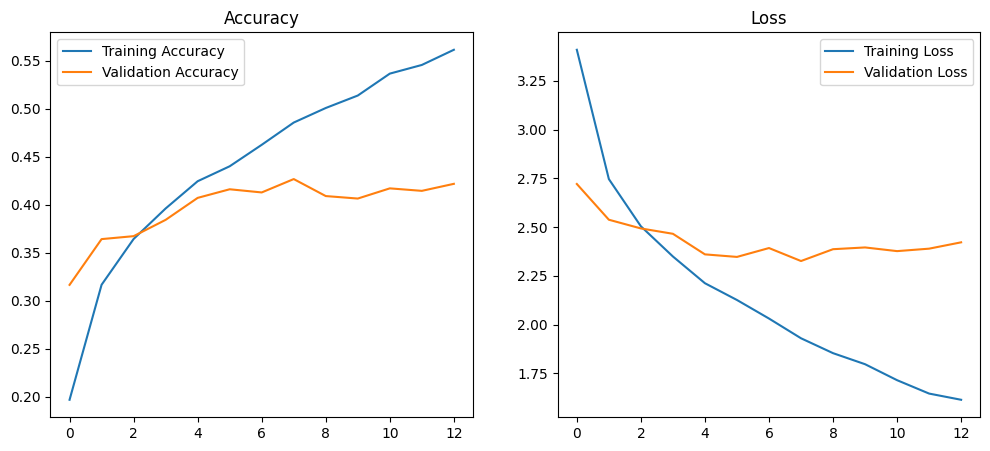

In [100]:
inception_v3_model = pretrained_model_fit(inception_v3_model,'InceptionV3',train_images,val_images,test_images)


                 MODEL EVALUATION                 

285/285 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.23      0.18      0.20        77
           1       0.37      0.32      0.34        77
           2       0.24      0.58      0.34        76
           3       0.26      0.36      0.30        78
           4       0.24      0.27      0.25        90
           5       0.39      0.29      0.33        98
           6       0.65      0.65      0.65        84
           7       0.58      0.61      0.60       103
           8       0.19      0.23      0.21        83
           9       0.36      0.53      0.43        97
          10       0.14      0.12      0.13        88
          11       0.29      0.55      0.38        76
          12       0.48      0.38      0.42        84
          13       0.40      0.29      0.34        83
          14       0.44      0.27      0.34        99
          15  

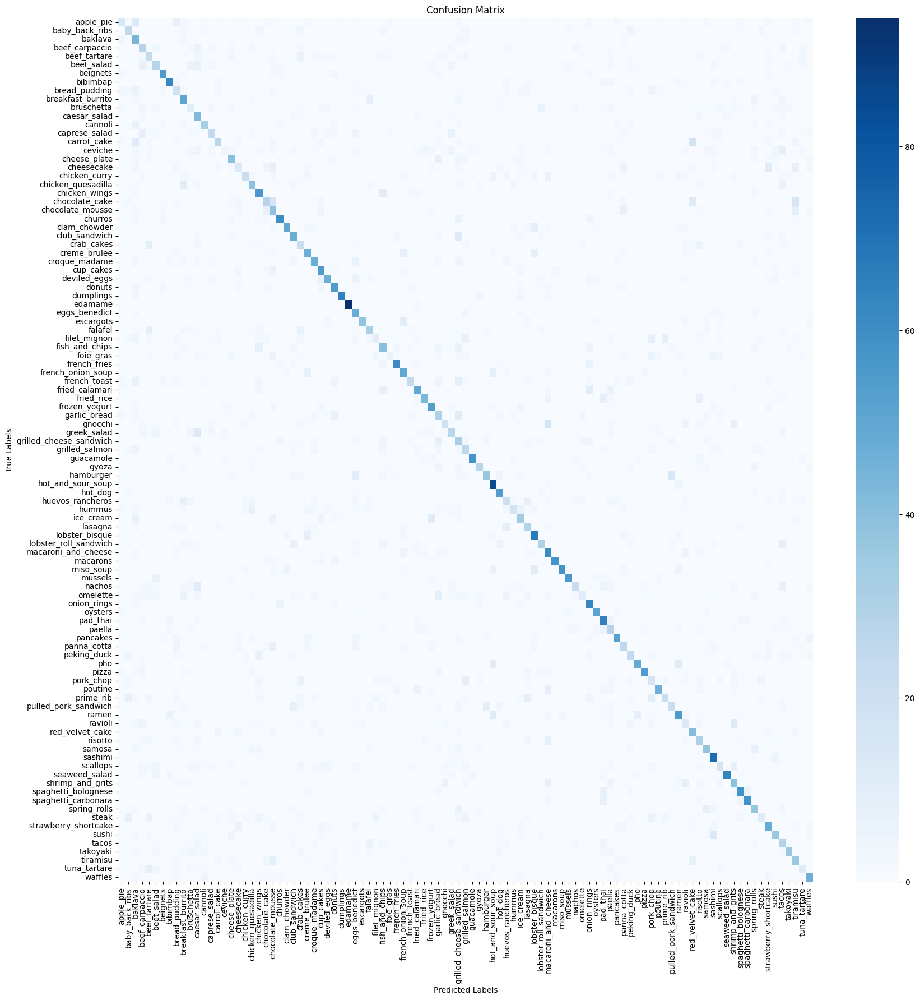


AUC Score: 0.9445


In [103]:
model_evaluation(inception_v3_model,test_images)

In [105]:
res_net_152_model = tf.keras.applications.ResNet152(
input_shape=(224, 224, 3),
include_top=False,
weights='imagenet',
pooling='avg'
)
res_net_152_model.trainable = False

234698864/234698864 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step



               SUMMARY OF THE MODEL               



Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_14[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 61,622,245 (235.07 MB)

 Trainable params: 3,251,301 (12.40 MB)

 Non-trainable params: 58,370,944 (222.67 MB)

None

                  MODEL TRAINING                  

Epoch 1/20
531/531 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - AUC: 0.5495 - accuracy: 0.0186 - loss: 4.6299
Epoch 1: val_loss improved from inf to 4.46214, saving model to best_ResNet152.keras
531/531 ━━━━━━━━━━━━━━━━━━━━ 123s 184ms/step - AUC: 0.5496 - accuracy: 0.0186 - loss: 4.6297 - val_AUC: 0.6349 - val_accuracy: 0.0290 - val_loss: 4.4621
Epoch 2/20
531/531 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - AUC: 0.6618 - accuracy: 0.0392 - loss: 4.4051
Epoch 2: val_loss improved from 4.46214 to 4.35117, saving model to best_ResNet152.keras
Epoch 2: Validation Loss Improvement: 0.1110
531/531 ━━━━━━━━━━━━━━━━━━━━ 78s 146ms/step - AUC: 0.6618 - accuracy: 0.0392 - loss: 4.4051 - val_AUC: 0.6833 - val_accuracy: 0.0467 - val_loss: 4.3512
Epoch 3/20
531/531 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - AUC: 0.6892 - accuracy: 0.0466 - loss: 4.3329
Epoch 3: val_loss improved from 4.35117 to 4.32397, saving model to best_ResNet152.keras
Epoch 3: Validation Los

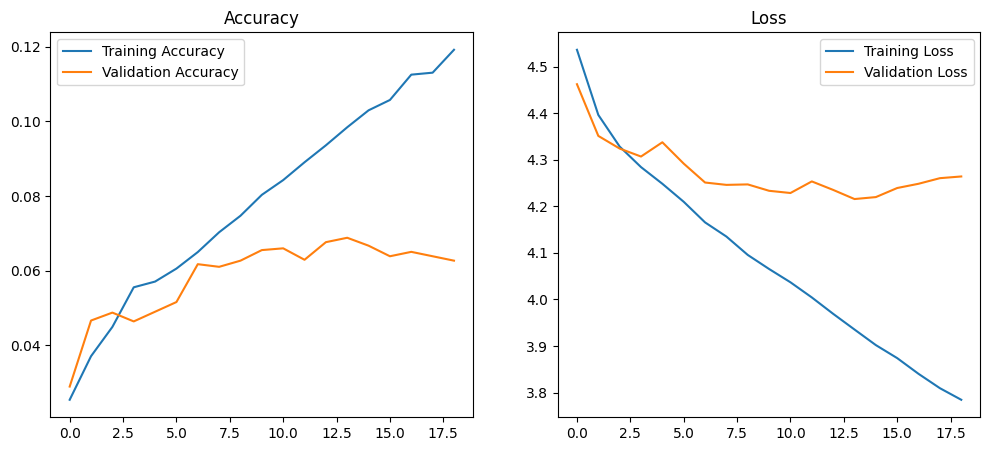

In [106]:
res_net_152_model = pretrained_model_fit(res_net_152_model,'ResNet152',train_images,val_images,test_images)

## Ensemble Of CNN Models

Soft Voting

In [173]:
def get_top_misclassified(conf_matrix, class_names, top_n=10):
    misclassified = []
    
    # Iterate through the confusion matrix to capture off-diagonal values
    for i in range(len(class_names)): 
        for j in range(len(class_names)): 
            if i != j:  
                misclassified.append(((i, j), conf_matrix[i, j]))
    
    # Sort the false positives by the count in descending order
    misclassified.sort(key=lambda x: x[1], reverse=True)
    
    # Return the top N false positives
    for mc in misclassified[:top_n]:
        print(f'{class_names[mc[0][0]]} misclassified as {class_names[mc[0][1]]} {mc[1]} times.'.upper())

    return misclassified[:top_n]

In [208]:
def get_image_by_label_from_iterator(iterator, target_label):
    for batch_images, batch_labels in iterator:
        for img, label in zip(batch_images, batch_labels):
            if np.argmax(label) == target_label:  
                return (img+1)/2 
    return None

In [209]:
def visualize_misclassified_images(misclassified, test_images,class_names):
    for (true_class_index, pred_class_index), _ in misclassified:
        true_example = get_image_by_label_from_iterator(test_images,true_class_index)
        pred_example = get_image_by_label_from_iterator(test_images,pred_class_index)
        # Create subplots to show both images side by side
        plt.figure(figsize=(10, 5))

        # Show the true class example
        plt.subplot(1, 2, 1)
        plt.imshow(true_example)
        true_class = class_names[true_class_index]
        plt.title(f"{true_class}".upper())
        plt.axis('off')

        # Show the predicted class example
        plt.subplot(1, 2, 2)
        plt.imshow(pred_example)
        pred_class = class_names[pred_class_index]
        plt.title(f"{pred_class}")
        plt.axis('off')

        # Display the images side by side
        plt.show()


In [210]:
def soft_vote(model1,model2,model3,test_images):
    # Get predictions (probabilities) from each model
    predictions_1 = model1.predict(test_images)
    predictions_2 = model2.predict(test_images)
    predictions_3 = model3.predict(test_images)
    # Soft voting: average the probabilities from all models
    avg_predictions = (predictions_1 + predictions_2 + predictions_3) / 3
       # Print Header for Evaluation    
    print_header('MODEL EVALUATION') 
    # Get the final predicted class (class with highest average probability)
    test_pred = np.argmax(avg_predictions, axis=1)
    test_labels = test_images.labels  
    
    ensemble_accuracy = accuracy_score(test_labels, test_pred)
    
    print(f'Accuracy of the Ensemble Model (Soft Voting): {ensemble_accuracy:.4f}')

    # Classification Report
    print("\nClassification Report:")
    print(classification_report(test_labels, test_pred))

    # Confusion Matrix
    print("\nConfusion Matrix:")
    cm = confusion_matrix(test_labels, test_pred)
    plt.figure(figsize=(20, 20))
    sns.heatmap(
        cm,
        fmt='d',
        cmap='Blues',
        xticklabels=test_images.class_indices.keys(),
        yticklabels=test_images.class_indices.keys()
    )
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()
    print_header('MOST CONFUSING CLASSES') 
    misclassified = get_top_misclassified(cm,list(test_images.class_indices.keys()))
    print_header('EXAMPLES') 
    visualize_misclassified_images(misclassified,test_images,list(test_images.class_indices.keys()))
    

285/285 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step
285/285 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step
285/285 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

                 MODEL EVALUATION                 

Accuracy of the Ensemble Model (Soft Voting): 0.5447

Classification Report:
              precision    recall  f1-score   support

           0       0.33      0.18      0.23        77
           1       0.36      0.65      0.46        77
           2       0.37      0.66      0.47        76
           3       0.44      0.55      0.49        78
           4       0.39      0.46      0.42        90
           5       0.41      0.40      0.41        98
           6       0.63      0.85      0.72        84
           7       0.51      0.75      0.60       103
           8       0.44      0.30      0.36        83
           9       0.54      0.45      0.49        97
          10       0.47      0.27      0.35        88
          11       0.60      0.70      0.64        76
          12       0.55      0.57    

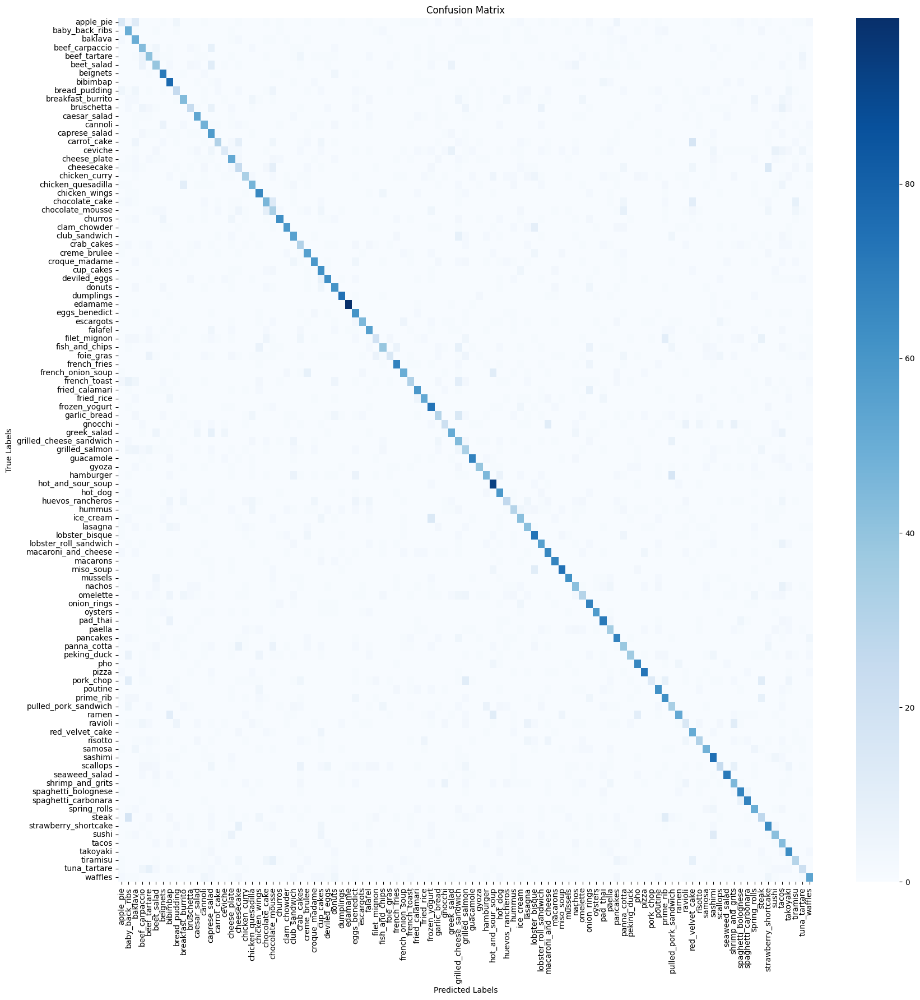


              MOST CONFUSING CLASSES              

CARROT_CAKE MISCLASSIFIED AS RED_VELVET_CAKE 17 TIMES.
STEAK MISCLASSIFIED AS BABY_BACK_RIBS 17 TIMES.
HAMBURGER MISCLASSIFIED AS PULLED_PORK_SANDWICH 16 TIMES.
GARLIC_BREAD MISCLASSIFIED AS GRILLED_CHEESE_SANDWICH 15 TIMES.
CHEESECAKE MISCLASSIFIED AS STRAWBERRY_SHORTCAKE 14 TIMES.
ICE_CREAM MISCLASSIFIED AS FROZEN_YOGURT 14 TIMES.
CHOCOLATE_CAKE MISCLASSIFIED AS CHOCOLATE_MOUSSE 13 TIMES.
APPLE_PIE MISCLASSIFIED AS BAKLAVA 12 TIMES.
SUSHI MISCLASSIFIED AS SASHIMI 12 TIMES.
BEET_SALAD MISCLASSIFIED AS CAPRESE_SALAD 11 TIMES.

                     EXAMPLES                     



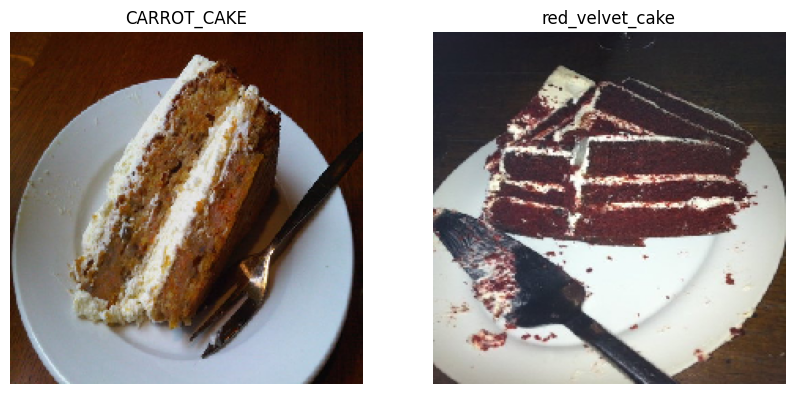

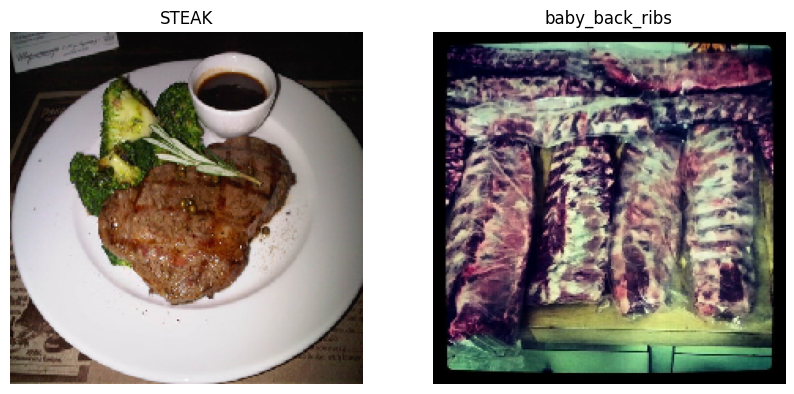

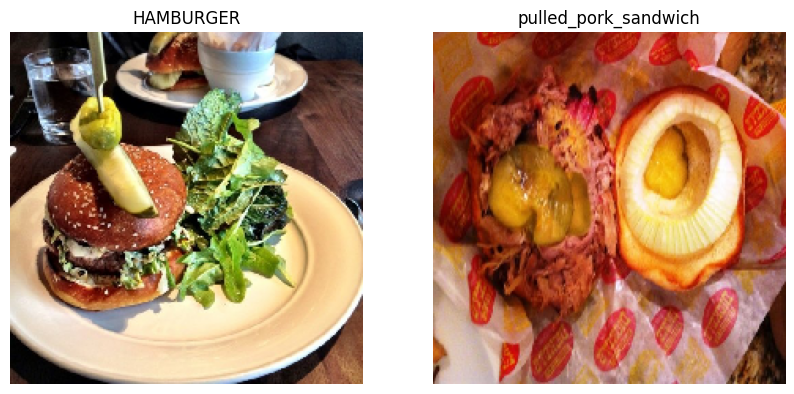

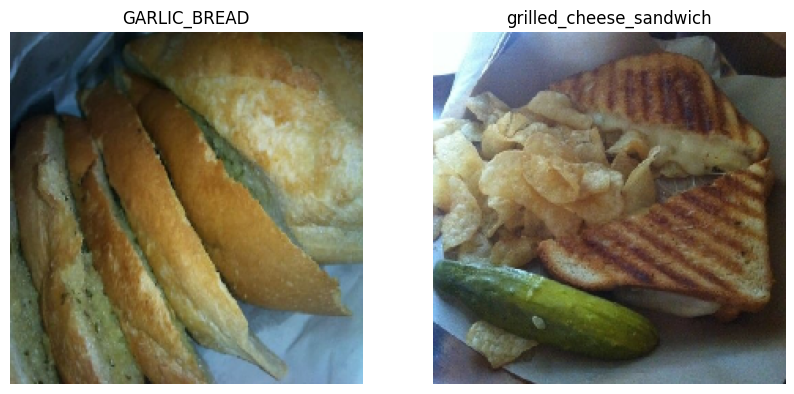

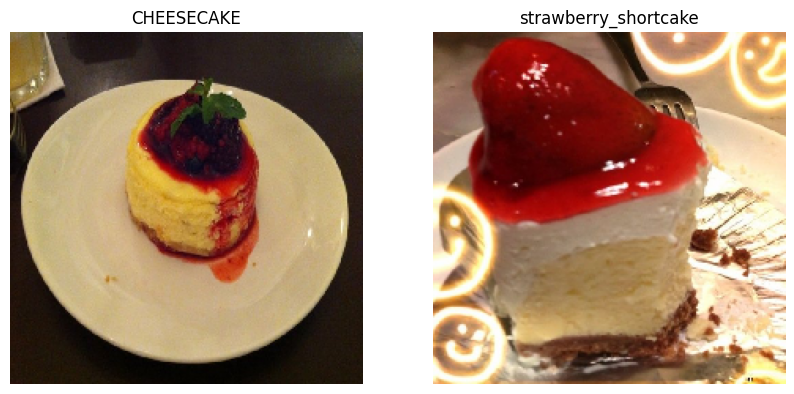

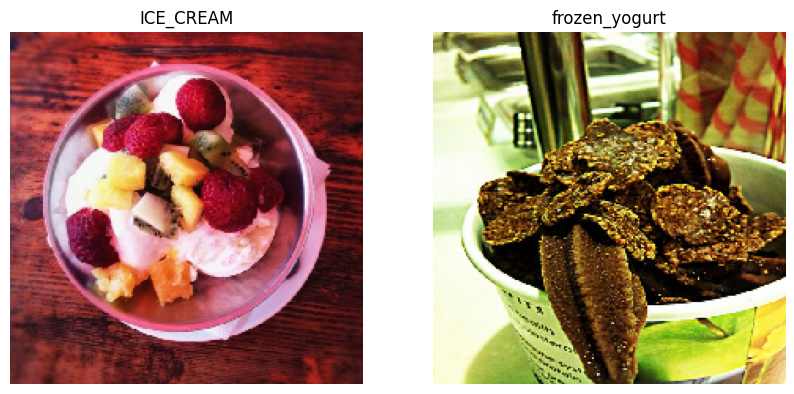

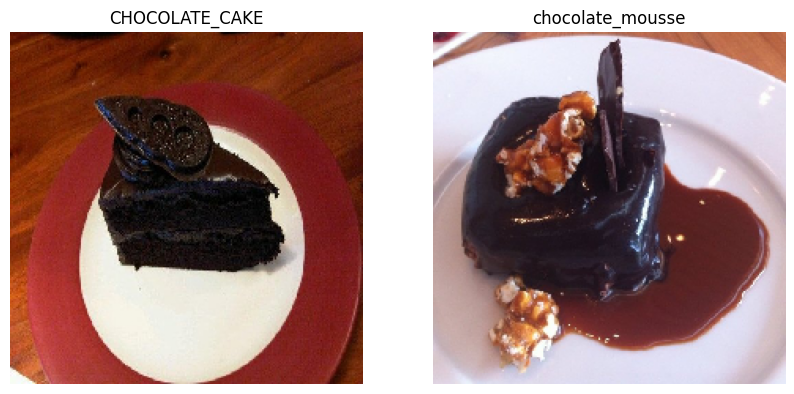

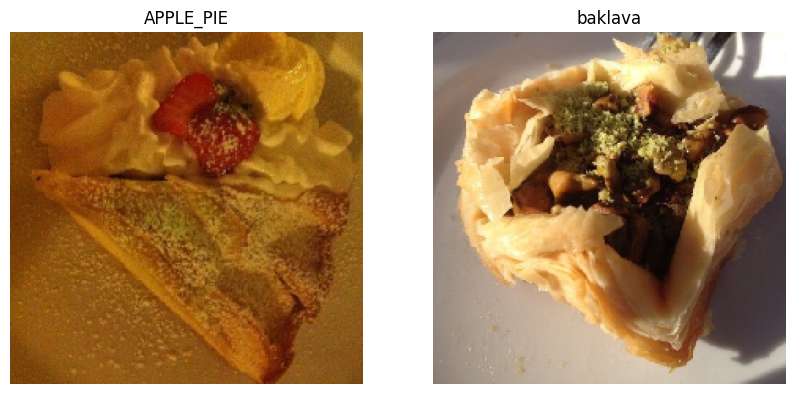

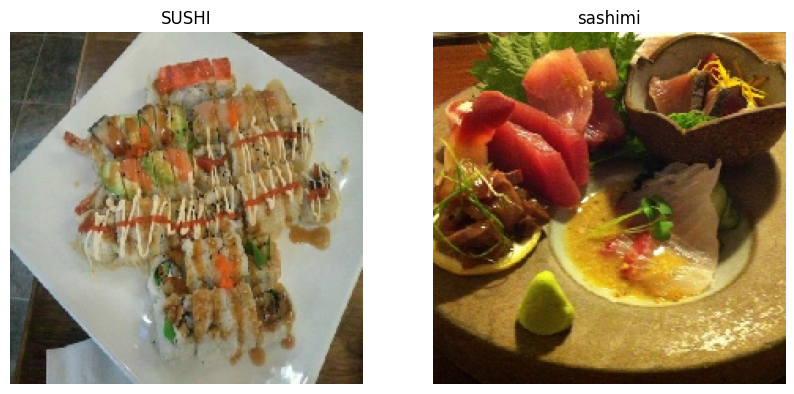

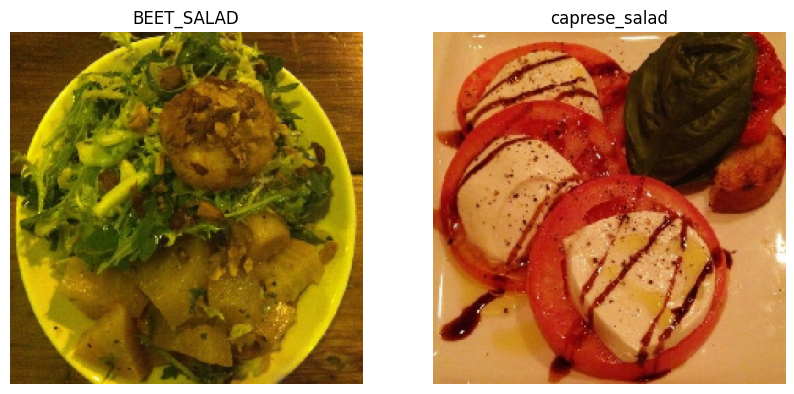

In [211]:
soft_vote(vgg19_model,mobile_net_model,inception_v3_model,test_images)